In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('/content/dataset.csv')

df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [3]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [4]:
df.shape

(112634, 17)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [6]:
df.isnull().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
Postal Code,0
Model Year,0
Make,0
Model,20
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [7]:
df.dropna(inplace=True)

df.shape

(112152, 17)

In [8]:
df.dtypes

,0
VIN (1-10),object
County,object
City,object
State,object
Postal Code,int64
Model Year,int64
Make,object
Model,object
Electric Vehicle Type,object
Clean Alternative Fuel Vehicle (CAFV) Eligibility,object


**TASK 1 - This is an open ended problem. Apply Exploratory Data Analysis (Univariate and Bivariate) on the dataset available above.**


**1. UNIVARIATE ANALYSIS**

*Statistical Non Visual Univariate Analysis*

In [9]:
discrete_df = df.select_dtypes(include=['object'])

numerical_df = df.select_dtypes(include=['int64', 'float64'])

In [10]:
def discrete_univariate_analysis(discrete_data):
    for col_name in discrete_data:
        print("*"*10, col_name, "*"*10)
        print(discrete_data[col_name].agg(['count', 'nunique', 'unique']))
        print('Value Counts: \n', discrete_data[col_name].value_counts())
        print()

In [11]:
discrete_univariate_analysis(discrete_df)

********** VIN (1-10) **********
count                                                 112152
nunique                                                 7522
unique     [JN1AZ0CP8B, 1G1FW6S08H, 3FA6P0SU1K, 5YJ3E1EB5...
Name: VIN (1-10), dtype: object
Value Counts: 
 VIN (1-10)
5YJYGDEE9M    471
5YJYGDEE0M    463
5YJYGDEE7M    447
5YJYGDEE8M    446
5YJYGDEE2M    435
             ... 
YV4BR0DL8M      1
JTJHKCFZ5N      1
WA1J2BFZ3N      1
KNDC4DLC5P      1
WA1LAAGE5M      1
Name: count, Length: 7522, dtype: int64

********** County **********
count                                                 112152
nunique                                                   39
unique     [Yakima, Skagit, Snohomish, Island, Thurston, ...
Name: County, dtype: object
Value Counts: 
 County
King            58980
Snohomish       12412
Pierce           8525
Clark            6681
Thurston         4109
Kitsap           3828
Whatcom          2839
Spokane          2785
Benton           1376
Island           1298
Ska

In [12]:
def numerical_univariate_analysis(numerical_data):
    for col_name in numerical_data:
        print("*"*10, col_name, "*"*10)
        print(numerical_data[col_name].agg(['min', 'max', 'mean', 'median', 'std']))
        print()

In [13]:
numerical_univariate_analysis(numerical_df)

********** Postal Code **********
min       98001.000000
max       99403.000000
mean      98258.856659
median    98121.000000
std         302.889935
Name: Postal Code, dtype: float64

********** Model Year **********
min       1997.000000
max       2023.000000
mean      2019.004494
median    2020.000000
std          2.891859
Name: Model Year, dtype: float64

********** Electric Range **********
min         0.000000
max       337.000000
mean       87.829651
median     32.000000
std       102.336645
Name: Electric Range, dtype: float64

********** Base MSRP **********
min            0.000000
max       845000.000000
mean        1793.882320
median         0.000000
std        10785.259118
Name: Base MSRP, dtype: float64

********** Legislative District **********
min        1.000000
max       49.000000
mean      29.817703
median    34.000000
std       14.698726
Name: Legislative District, dtype: float64

********** DOL Vehicle ID **********
min       4.777000e+03
max       4.792548e+08
mean

*Visual Univariate Analysis*

array([[<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>]],
      dtype=object)

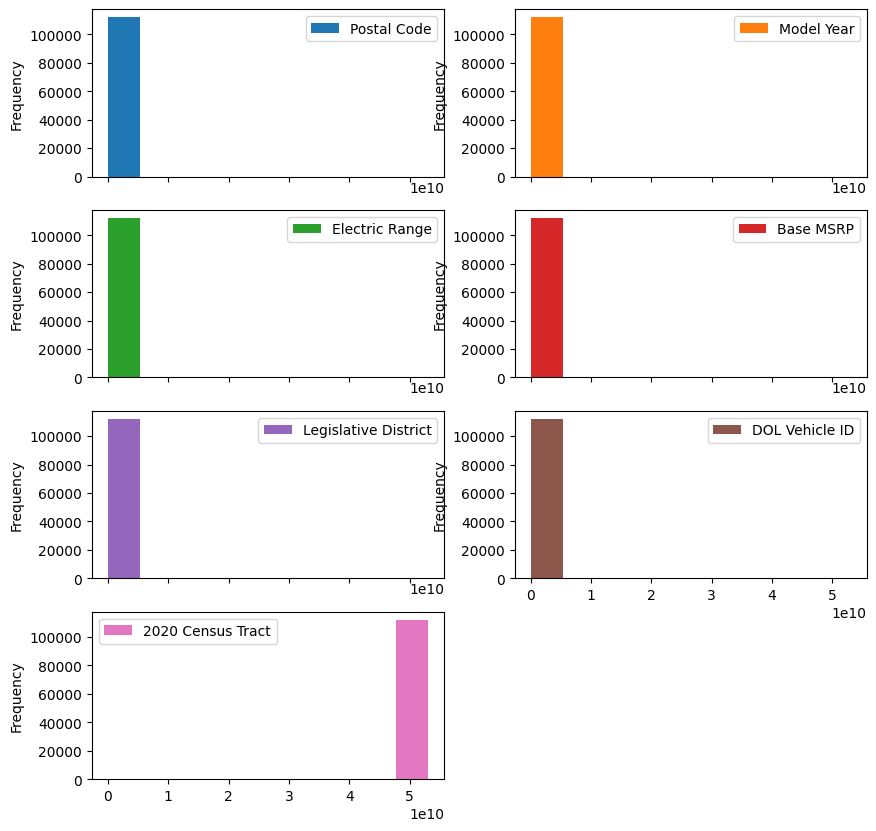

In [14]:
df.plot(kind='hist', subplots=True, layout=(4, 2), figsize=(10, 10))

,0
Postal Code,"Axes(0.125,0.712609;0.352273x0.167391)"
Model Year,"Axes(0.547727,0.712609;0.352273x0.167391)"
Electric Range,"Axes(0.125,0.511739;0.352273x0.167391)"
Base MSRP,"Axes(0.547727,0.511739;0.352273x0.167391)"
Legislative District,"Axes(0.125,0.31087;0.352273x0.167391)"
DOL Vehicle ID,"Axes(0.547727,0.31087;0.352273x0.167391)"
2020 Census Tract,"Axes(0.125,0.11;0.352273x0.167391)"


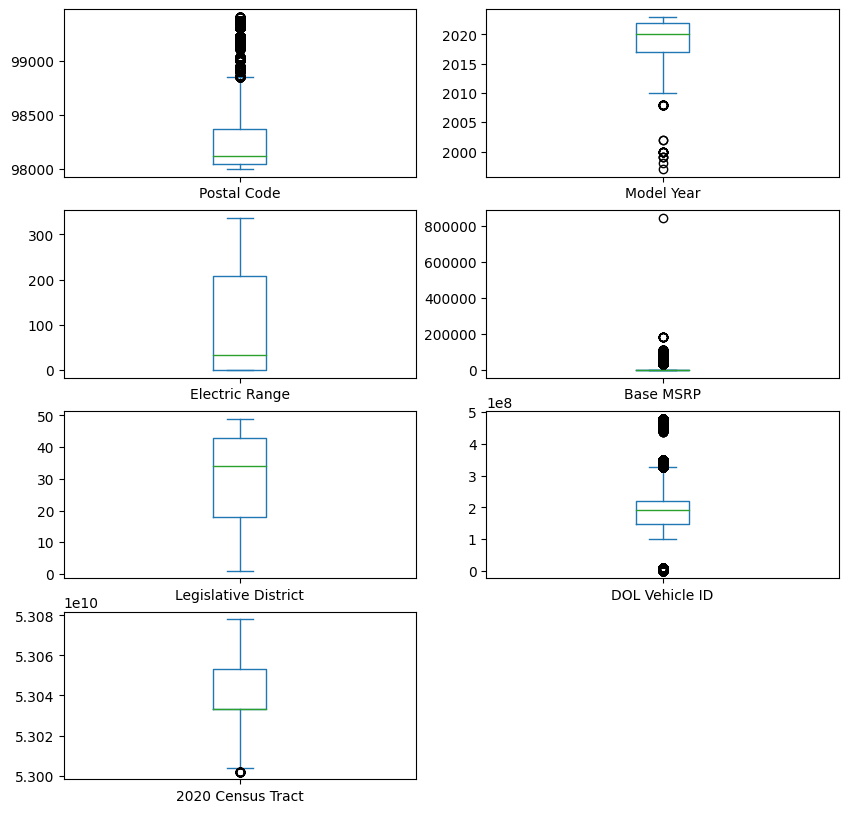

In [15]:
df.plot(kind='box', subplots=True, layout=(4, 2), figsize=(10, 10))

**2. BIVARIATE ANALYSIS**

*a. Continuous vs Continuous Numerical Data*

In [16]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [17]:
df.corr(numeric_only=True)

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
Postal Code,1.000000,-0.054799,-0.030914,-0.009447,-0.432551,-0.004615,0.020639
Model Year,-0.054799,1.000000,-0.288952,-0.229369,0.010423,-0.068401,-0.030528
Electric Range,-0.030914,-0.288952,1.000000,0.085310,0.024383,0.009579,-0.015352
Base MSRP,-0.009447,-0.229369,0.085310,1.000000,0.012474,0.000461,-0.002684
Legislative District,-0.432551,0.010423,0.024383,0.012474,1.000000,-0.001642,-0.111296
DOL Vehicle ID,-0.004615,-0.068401,0.009579,0.000461,-0.001642,1.000000,-0.000547
2020 Census Tract,0.020639,-0.030528,-0.015352,-0.002684,-0.111296,-0.000547,1.000000


<Axes: xlabel='Electric Range', ylabel='Base MSRP'>

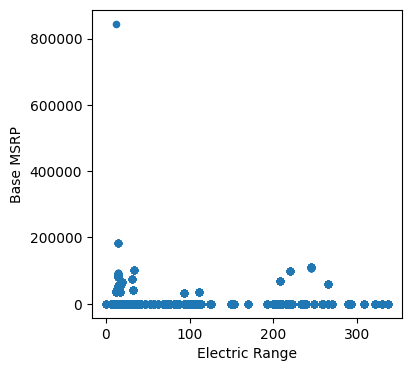

In [18]:
df.plot(kind='scatter', y ='Base MSRP', x='Electric Range',figsize=(4, 4))

*b. Discrete vs Discrete Data*

In [19]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [20]:
pd.crosstab(df['Make'], df['Electric Vehicle Type'])

Electric Vehicle Type,Battery Electric Vehicle (BEV),Plug-in Hybrid Electric Vehicle (PHEV)
Make,,
AUDI,1119,1201
AZURE DYNAMICS,7,0
BENTLEY,0,3
BMW,903,3757
CADILLAC,0,108
CHEVROLET,5270,4870
CHRYSLER,0,1780
FIAT,820,0
FISKER,0,19


In [21]:
pd.crosstab(df['Make'], df['Electric Vehicle Type'], normalize=True)

Electric Vehicle Type,Battery Electric Vehicle (BEV),Plug-in Hybrid Electric Vehicle (PHEV)
Make,,
AUDI,0.009978,0.010709
AZURE DYNAMICS,0.000062,0.000000
BENTLEY,0.000000,0.000027
BMW,0.008052,0.033499
CADILLAC,0.000000,0.000963
CHEVROLET,0.046990,0.043423
CHRYSLER,0.000000,0.015871
FIAT,0.007312,0.000000
FISKER,0.000000,0.000169


In [22]:
pd.crosstab(df['Make'], df['Electric Vehicle Type'], normalize='index')

Electric Vehicle Type,Battery Electric Vehicle (BEV),Plug-in Hybrid Electric Vehicle (PHEV)
Make,,
AUDI,0.482328,0.517672
AZURE DYNAMICS,1.000000,0.000000
BENTLEY,0.000000,1.000000
BMW,0.193777,0.806223
CADILLAC,0.000000,1.000000
CHEVROLET,0.519724,0.480276
CHRYSLER,0.000000,1.000000
FIAT,1.000000,0.000000
FISKER,0.000000,1.000000


In [23]:
pd.crosstab(df['Make'], df['Electric Vehicle Type'], normalize='index', margins = True)

Electric Vehicle Type,Battery Electric Vehicle (BEV),Plug-in Hybrid Electric Vehicle (PHEV)
Make,,
AUDI,0.482328,0.517672
AZURE DYNAMICS,1.000000,0.000000
BENTLEY,0.000000,1.000000
BMW,0.193777,0.806223
CADILLAC,0.000000,1.000000
CHEVROLET,0.519724,0.480276
CHRYSLER,0.000000,1.000000
FIAT,1.000000,0.000000
FISKER,0.000000,1.000000


In [24]:
pd.crosstab(df['Make'], df['Electric Vehicle Type'], normalize= 'columns')

Electric Vehicle Type,Battery Electric Vehicle (BEV),Plug-in Hybrid Electric Vehicle (PHEV)
Make,,
AUDI,0.013052,0.045458
AZURE DYNAMICS,0.000082,0.000000
BENTLEY,0.000000,0.000114
BMW,0.010533,0.142203
CADILLAC,0.000000,0.004088
CHEVROLET,0.061471,0.184330
CHRYSLER,0.000000,0.067373
FIAT,0.009565,0.000000
FISKER,0.000000,0.000719


In [25]:
pd.crosstab(df['Make'], df['Electric Vehicle Type'], normalize= 'columns', margins = True)

Electric Vehicle Type,Battery Electric Vehicle (BEV),Plug-in Hybrid Electric Vehicle (PHEV),All
Make,,,
AUDI,0.013052,0.045458,0.020686
AZURE DYNAMICS,0.000082,0.000000,0.000062
BENTLEY,0.000000,0.000114,0.000027
BMW,0.010533,0.142203,0.041551
CADILLAC,0.000000,0.004088,0.000963
CHEVROLET,0.061471,0.184330,0.090413
CHRYSLER,0.000000,0.067373,0.015871
FIAT,0.009565,0.000000,0.007312
FISKER,0.000000,0.000719,0.000169


<Axes: xlabel='Make'>

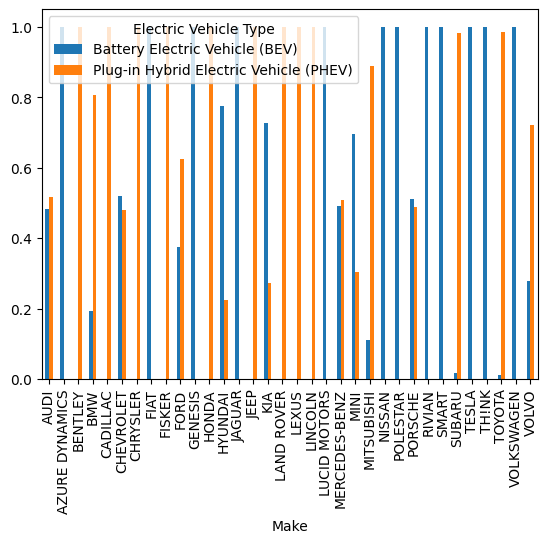

In [26]:
tab = pd.crosstab(df['Make'], df['Electric Vehicle Type'], normalize='index')

tab.plot(kind='bar')

<Axes: ylabel='Make'>

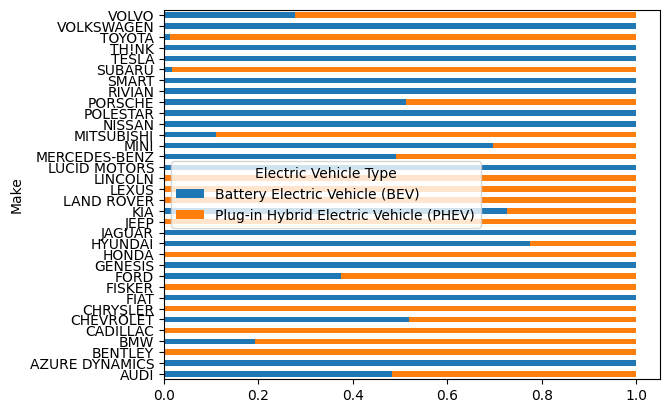

In [27]:
tab.plot(kind='barh', stacked=True)

*c. Continuous Numerical vs Discrete Data*

In [28]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112152 entries, 2 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112152 non-null  object 
 1   County                                             112152 non-null  object 
 2   City                                               112152 non-null  object 
 3   State                                              112152 non-null  object 
 4   Postal Code                                        112152 non-null  int64  
 5   Model Year                                         112152 non-null  int64  
 6   Make                                               112152 non-null  object 
 7   Model                                              112152 non-null  object 
 8   Electric Vehicle Type                              112152 non-null  object 
 9 

In [30]:
group = df.groupby('Model Year')

group['Base MSRP'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
Model Year,,,,
1997,0,0,0.000000,0.0
1998,0,0,0.000000,0.0
1999,0,0,0.000000,0.0
2000,0,0,0.000000,0.0
2002,0,0,0.000000,0.0
2008,98950,98950,98950.000000,98950.0
2010,110950,110950,110950.000000,110950.0
2011,0,109000,913.772455,0.0
2012,0,102000,5878.820059,0.0


<Axes: title={'center': 'Base MSRP'}, xlabel='Model Year'>

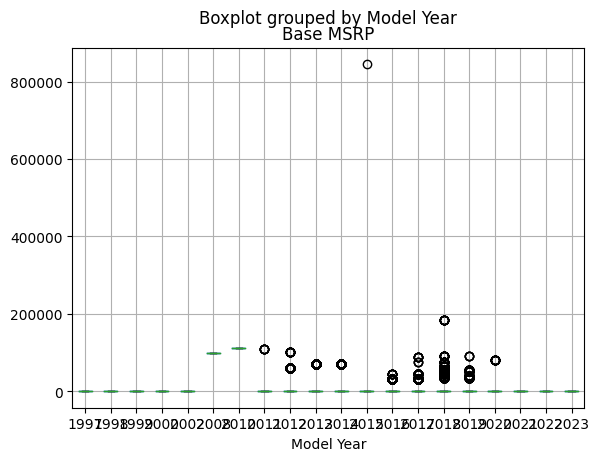

In [31]:
df.boxplot(by='Model Year', column=['Base MSRP'])

<Figure size 1200x800 with 0 Axes>

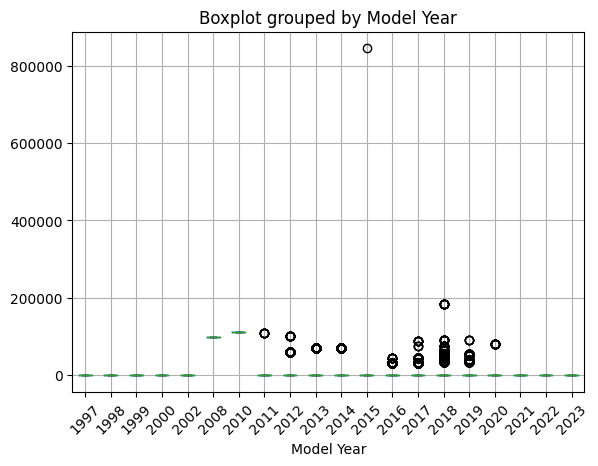

In [32]:
import matplotlib.pyplot as plt

# Increase figure size and rotate x-axis labels
plt.figure(figsize=(12, 8))  # Increase size of the plot
df.boxplot(by='Model Year', column=['Base MSRP'])
plt.xticks(rotation=45)  # Rotate x-axis labels to avoid overlap
plt.title('Boxplot grouped by Model Year')  # Re-add title after boxplot
plt.suptitle('')  # Remove the default pandas title
plt.show()


**TASK 2 - Create a Choropleth using plotly.express to display the number of EV vehicles based on location.**

In [33]:
!pip install plotly

In [34]:
df = pd.read_csv('/content/dataset.csv')

In [35]:
import plotly.express as px

In [36]:
#Scatter Plot using plotly.express
px.scatter(df, x = 'Model Year', y = 'Electric Range', color = 'Electric Vehicle Type')


In [37]:
# Box Plot using plotly.express
px.box(df, x = 'Model Year', y = 'Electric Range', color = 'Electric Vehicle Type')

In [38]:
# Box Plot using plotly.express
px.box(df, x = 'Model Year', y = 'Base MSRP', color = 'Electric Vehicle Type')

In [39]:
# Pie Chart Plot using plotly.express
px.pie(df, values = 'Electric Range', names = 'Electric Vehicle Type')

In [40]:
# Pie Chart Plot using plotly.express
px.pie(df, values = 'Electric Range', names = 'Model Year')

In [41]:
#Choropleth Plot using plotly.express
px.choropleth(df, locations = 'Make', color = 'Electric Range')

In [42]:
#Choropleth Plot using plotly.express
px.choropleth(df, locations = 'Model Year', color = 'Electric Range')

In [43]:
# Animated Choropleth Plot using plotly.express
fig = px.choropleth(
    df,
    locations='State',
    locationmode="USA-states",
    color='Electric Range',
    animation_frame='Model Year',
    color_continuous_scale="Viridis",
    scope="usa"
)
fig.show()

**TASK 3: Create a Racing Bar Plot to display the animation of EV Make and its count each year.**


In [44]:
!pip install bar_chart_race

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 3.3 MB/s eta 0:00:00


In [45]:
import bar_chart_race as bcr

In [46]:
df['Model Year'] = pd.to_datetime(df['Model Year'], format='%Y').dt.year.astype(str)
ev_make_count = df.groupby(['Model Year', 'Make']).size().reset_index(name='Count')

In [47]:
# Create the Racing Bar Plot
fig = px.bar(
    ev_make_count,
    x='Make',
    y='Count',
    animation_frame='Model Year',
    animation_group='Make',
    range_y=[0, ev_make_count['Count'].max() + 10],
    title='EV Make Count Over the Years',
)

# Set the layout and labels for better visualization
fig.update_layout(
    xaxis_title='EV Make',
    yaxis_title='Count',
    showlegend=False,
    title_font_size=24,
)

# Show the Racing Bar Plot
fig.show()